# Sanket Mayekar | Project: Pins Face Recognition

------------

## GitHub Link:

* https://github.com/SANKETM17/Sanket-Mayekar-Deep-Learning-Class-Project.git


* SSH: 
git@github.com:SANKETM17/Sanket-Mayekar-Deep-Learning-Class-Project.git

-------------------

# Platform: Google Colab

Code was executed on Google Colab

-------------------

## Project Description

In this project, the goal is to build a face identification model to recognize faces.

## About Dataset

### Content
Images has been collected from Pinterest and cropped. There are 105 celebrities and 17534 faces.

Data Source: Kaggle (Facial Recognition Dataset collected from Pinterest)

link: 

https://www.kaggle.com/datasets/hereisburak/pins-face-recognition

-------------------

Face recognition deals with Computer Vision a discipline of Artificial Intelligence and uses techniques of image processing and deep learning. Face recognition algorithms can be further classified based on whether they are used on 2D or 3D images or on finding faces in motion, like in a video.

### Face Detection vs. Face Recognition

* Though they sound similar, the complexity involved in both is vastly different. In Face Detection, the computer recognizes the face within an image and locates its position. If you have used face changer app on Snapchat, you are using face detection. Face recognition deals with identification to establish whose face it is by matching it to an existing face database. 

-----------------------

# 1. Problem Statement

a. Our objective is to develop a machine learning model that effectively employs deep learning principles, specifically a Convolutional Neural Network (CNN), to recognize and identify celebrities in a dataset of facial images using face recognition technology.

b. Given a facial image of a celebrity, the goal of our face recognition model is to accurately recognize the individual in the image by matching it with known images of celebrities in our dataset. This dataset is derived from Pinterest and comprises 17,534 facial images representing 105 different celebrities. Our model must adeptly recognize and differentiate the diverse and complex facial characteristics that these images exhibit.

c. The face recognition challenge is elevated by the wide variability in facial features among individuals and the various factors that can alter facial appearance, such as lighting, pose, expression, and occlusions. Hence, we are leveraging the VGG16 model, a deep CNN model pre-trained on the large-scale ImageNet dataset, to harness the power of transfer learning for our face recognition task. This strategy allows us to start our model with pre-learned weights that have already recognized a multitude of complex features from a large dataset, providing a solid foundation for our face recognition task.

d. By building a robust face recognition model using transfer learning, we aim to provide precise celebrity identification while mitigating the risks of overfitting, especially given the relative size of our dataset.

--------------

# Assumptions/Hypotheses about Data and Model

1. **Data Quality**: We assume the images in our dataset are of sufficient quality to allow accurate face recognition, and that each celebrity's images exhibit a range of facial expressions and angles to promote model generalization.

2. **Label Accuracy**: We presume that the celebrities in the images are correctly labeled, which is vital for the training and evaluation of our face recognition model.

3. **Transfer Learning**: We hypothesize that VGG16, a pre-trained model, will be effective in our face recognition task, aiding in feature extraction from our dataset's facial images.

4. **Model Robustness**: We expect that the depth of VGG16 will help manage the variability and complexity of the facial features present in our dataset, and therefore enhance face recognition accuracy.

5. **Fairness**: Given the diversity of celebrities, we anticipate our model to be fair and not biased towards recognizing certain individuals more accurately than others.

6. **Ethics and Privacy**: We operate under the assumption that the face recognition model's use will comply with ethical guidelines and respect the privacy of individuals.

------------------------------

In [143]:
# Mount Google Drive

from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [144]:
# Set working directory

import os
os.chdir('/content/drive/My Drive/MSCA 31009 MLPA')

In [145]:
!pwd

/content/drive/My Drive/MSCA 31009 MLPA


In [146]:
!ls

Backup	 embeddings.pkl    finalized_model.pkl	 vgg_face_weights.h5
Dataset  facenet_keras.h5  grid_search_poly.sav


In [147]:
# Extract zip file

import zipfile
with zipfile.ZipFile('archive.zip', 'r') as zip_ref:
  zip_ref.extractall('/content/drive/My Drive/MSCA 31009 MLPA/Dataset')

In [148]:
# Extract "vgg_face_weights.h5"

with zipfile.ZipFile('archive11.zip', 'r') as zip_ref:
  zip_ref.extractall('/content/drive/My Drive/MSCA 31009 MLPA')

In [149]:
os.listdir("Dataset/105_classes_pins_dataset")

['pins_Adriana Lima',
 'pins_Alex Lawther',
 'pins_Alexandra Daddario',
 'pins_Alvaro Morte',
 'pins_Amanda Crew',
 'pins_Andy Samberg',
 'pins_Anne Hathaway',
 'pins_Anthony Mackie',
 'pins_Avril Lavigne',
 'pins_Ben Affleck',
 'pins_Bill Gates',
 'pins_Bobby Morley',
 'pins_Brenton Thwaites',
 'pins_Brian J. Smith',
 'pins_Brie Larson',
 'pins_Chris Evans',
 'pins_Chris Hemsworth',
 'pins_Chris Pratt',
 'pins_Christian Bale',
 'pins_Cristiano Ronaldo',
 'pins_Danielle Panabaker',
 'pins_Dominic Purcell',
 'pins_Dwayne Johnson',
 'pins_Eliza Taylor',
 'pins_Elizabeth Lail',
 'pins_Emilia Clarke',
 'pins_Emma Stone',
 'pins_Emma Watson',
 'pins_Gwyneth Paltrow',
 'pins_Henry Cavil',
 'pins_Hugh Jackman',
 'pins_Inbar Lavi',
 'pins_Irina Shayk',
 'pins_Jake Mcdorman',
 'pins_Jason Momoa',
 'pins_Jennifer Lawrence',
 'pins_Jeremy Renner',
 'pins_Jessica Barden',
 'pins_Jimmy Fallon',
 'pins_Johnny Depp',
 'pins_Josh Radnor',
 'pins_Katharine Mcphee',
 'pins_Katherine Langford',
 'pins_Ke

-------------

In [150]:
import os
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
import seaborn as sns

In [151]:
import cv2
import matplotlib.pyplot as plt
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import ZeroPadding2D, Convolution2D, MaxPooling2D, Dropout, Flatten, Activation

In [152]:
from keras.models import Sequential, Model
from keras.layers import ZeroPadding2D, Convolution2D, MaxPooling2D, Dropout, Flatten, Activation
from keras.layers import Dense

In [153]:
from sklearn.preprocessing import LabelEncoder, StandardScaler
from sklearn.decomposition import PCA

----------------

# 3. Exploratory Data Analysis

In [154]:
# dataset path
dataset_path = "Dataset/105_classes_pins_dataset"

# list of all the classes (folders)
folders = os.listdir(dataset_path)

# number of images per class
images_per_class = {}

## 3.1. Number of images per class

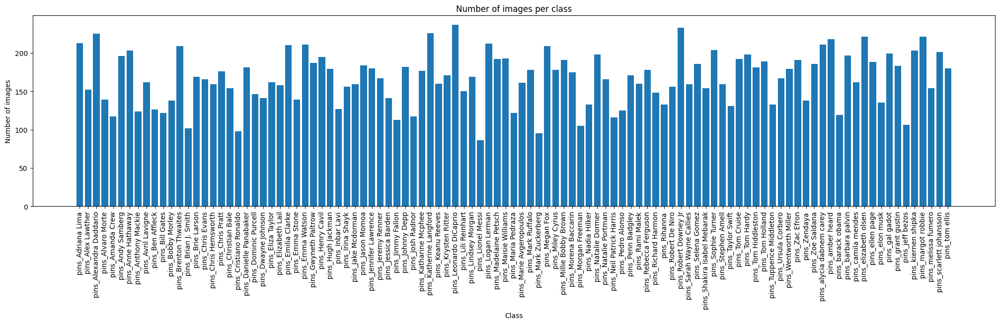

In [155]:
for folder in folders:
    images_per_class[folder] = len(os.listdir(os.path.join(dataset_path, folder)))

plt.figure(figsize=(25, 5))
plt.bar(images_per_class.keys(), images_per_class.values())
plt.title('Number of images per class')
plt.xlabel('Class')
plt.ylabel('Number of images')
plt.xticks(rotation='vertical')
plt.show()

In [156]:
# number of images per class
for class_name, count in images_per_class.items():
    print(f'Class: {class_name}: {count}')

Class: pins_Adriana Lima: 213
Class: pins_Alex Lawther: 152
Class: pins_Alexandra Daddario: 225
Class: pins_Alvaro Morte: 139
Class: pins_Amanda Crew: 117
Class: pins_Andy Samberg: 196
Class: pins_Anne Hathaway: 203
Class: pins_Anthony Mackie: 124
Class: pins_Avril Lavigne: 162
Class: pins_Ben Affleck: 126
Class: pins_Bill Gates: 122
Class: pins_Bobby Morley: 138
Class: pins_Brenton Thwaites: 209
Class: pins_Brian J. Smith: 102
Class: pins_Brie Larson: 169
Class: pins_Chris Evans: 166
Class: pins_Chris Hemsworth: 159
Class: pins_Chris Pratt: 176
Class: pins_Christian Bale: 154
Class: pins_Cristiano Ronaldo: 98
Class: pins_Danielle Panabaker: 181
Class: pins_Dominic Purcell: 146
Class: pins_Dwayne Johnson: 141
Class: pins_Eliza Taylor: 162
Class: pins_Elizabeth Lail: 158
Class: pins_Emilia Clarke: 210
Class: pins_Emma Stone: 139
Class: pins_Emma Watson: 211
Class: pins_Gwyneth Paltrow: 187
Class: pins_Henry Cavil: 195
Class: pins_Hugh Jackman: 179
Class: pins_Inbar Lavi: 127
Class: pins

* Looking at the numbers of images per class, there is some variation in the number of images per class.

* For example, the class 'pins_Lionel Messi' only has 86 images, while 'pins_Leonardo DiCaprio' has 237 images. 


* This imbalance could potentially skew the training of model, as classes with more data might be better represented in the model's decision boundaries.

## 3.2. Displaying some sample images

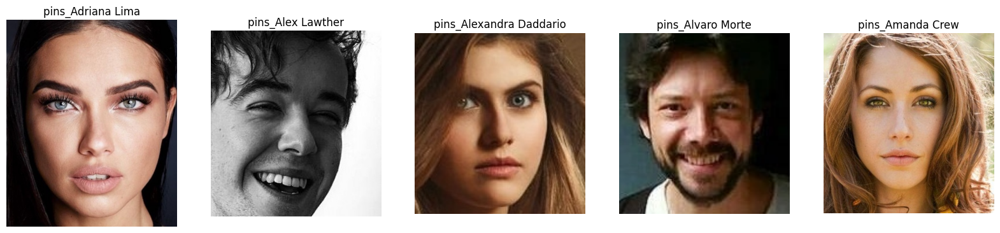

In [157]:
sample_images = []

for folder in folders[:5]:  # Choosing the first 5 folders
    image = cv2.imread(os.path.join(dataset_path, folder, os.listdir(os.path.join(dataset_path, folder))[0]))
    sample_images.append(image)

fig, ax = plt.subplots(1, 5, figsize=(20, 20))

for i, img in enumerate(sample_images):
    ax[i].imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
    ax[i].axis('off')
    ax[i].set_title(folders[i])

plt.show()

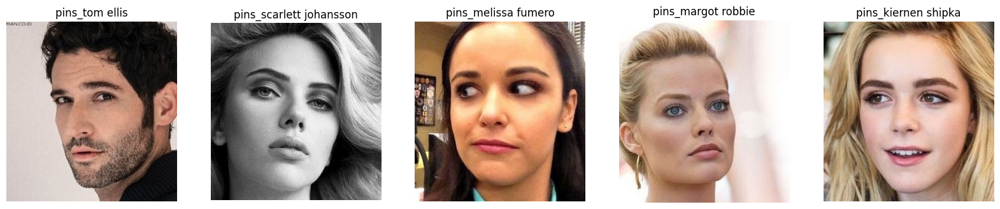

In [158]:
# Displaying some sample images from the last 5 folders
sample_images = []

for folder in folders[::-1][:5]:  # Choosing the last 5 folders
    image = cv2.imread(os.path.join(dataset_path, folder, os.listdir(os.path.join(dataset_path, folder))[0]))
    sample_images.append(image)

fig, ax = plt.subplots(1, 5, figsize=(20, 20))

for i, img in enumerate(sample_images):
    ax[i].imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
    ax[i].axis('off')
    ax[i].set_title(folders[::-1][i])

plt.show()

## 3.3. Image Dimensions

In [159]:
# get image dimensions
def get_img_dimensions(img_path):
    img = mpimg.imread(img_path)
    return img.shape

In [160]:
img_dirs = os.listdir("Dataset/105_classes_pins_dataset")
img_dims = [get_img_dimensions(f"Dataset/105_classes_pins_dataset/{dir}/{os.listdir('Dataset/105_classes_pins_dataset/' + dir)[0]}") for dir in img_dirs]

In [161]:
print("Image dimensions: \n")
img_dims

Image dimensions: 



[(668, 550, 3),
 (320, 293, 3),
 (185, 174, 3),
 (155, 146, 3),
 (387, 365, 3),
 (184, 174, 3),
 (221, 209, 3),
 (108, 102, 3),
 (221, 209, 3),
 (221, 209, 3),
 (99, 122, 3),
 (155, 146, 3),
 (128, 121, 3),
 (387, 356, 3),
 (108, 102, 3),
 (320, 302, 3),
 (155, 145, 3),
 (266, 251, 3),
 (155, 145, 3),
 (225, 209, 3),
 (154, 145, 3),
 (268, 302, 3),
 (108, 102, 3),
 (225, 212, 3),
 (320, 302, 3),
 (320, 302, 3),
 (221, 209, 3),
 (129, 121, 3),
 (463, 437, 3),
 (266, 240, 3),
 (266, 255, 3),
 (387, 365, 3),
 (128, 122, 3),
 (266, 255, 3),
 (266, 251, 3),
 (184, 174, 3),
 (119, 145, 3),
 (154, 146, 3),
 (184, 175, 3),
 (154, 146, 3),
 (108, 102, 3),
 (128, 121, 3),
 (221, 209, 3),
 (387, 365, 3),
 (221, 209, 3),
 (266, 255, 3),
 (155, 146, 3),
 (266, 251, 3),
 (184, 175, 3),
 (221, 209, 3),
 (243, 251, 3),
 (185, 175, 3),
 (266, 251, 3),
 (108, 102, 3),
 (108, 102, 3),
 (264, 255, 3),
 (387, 365, 3),
 (266, 255, 3),
 (264, 251, 3),
 (221, 209, 3),
 (221, 212, 3),
 (320, 302, 3),
 (266, 25

## 3.4. Display an image from all the folders

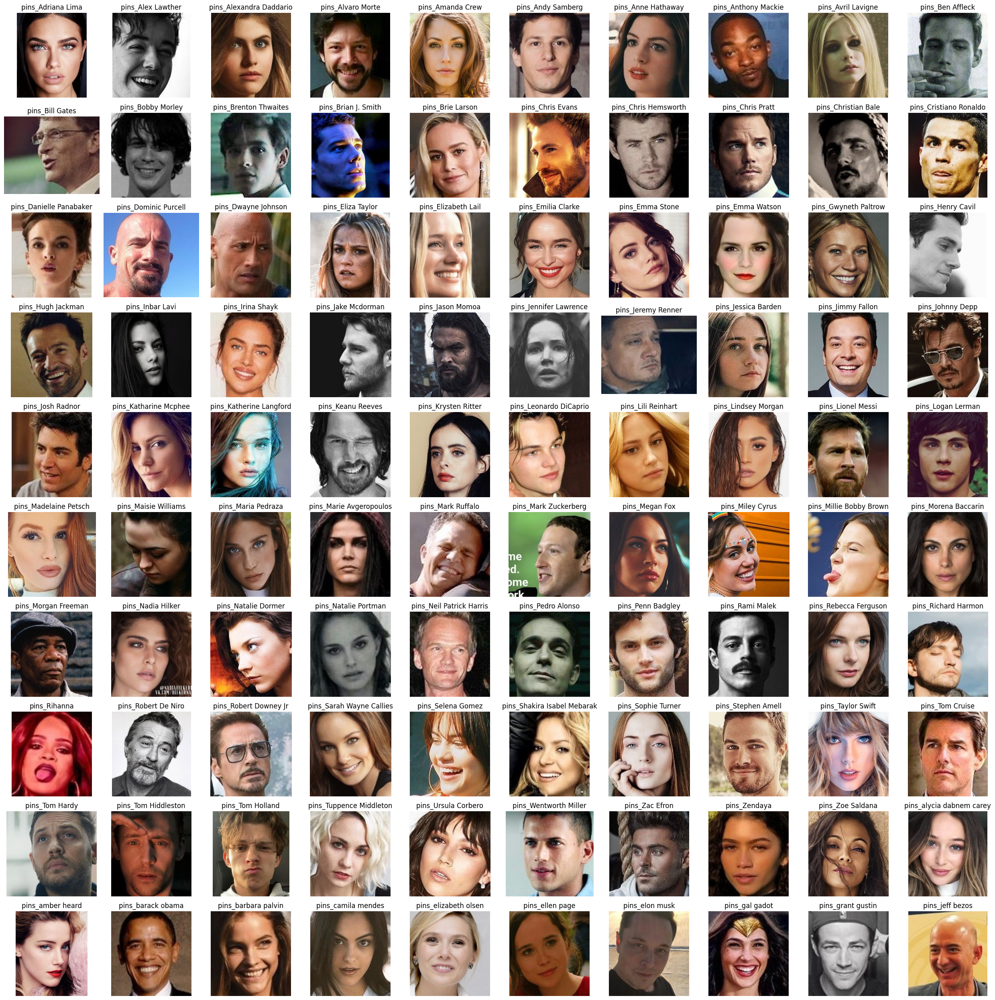

In [162]:
fig, axs = plt.subplots(10, 10, figsize=(25, 25))

for i, ax in enumerate(axs.flat):
    if i < len(img_dirs):  # to prevent index out of range error
        img_dir = img_dirs[i]
        img_path = f"Dataset/105_classes_pins_dataset/{img_dir}/{os.listdir('Dataset/105_classes_pins_dataset/' + img_dir)[0]}"
        img = mpimg.imread(img_path)
        ax.imshow(img)
        ax.set_title(img_dir)
        ax.axis('off')  # Hide axes

plt.tight_layout()
plt.show()

----------------------

# Data Preprocessing

## Load Images

Map each image with a person's ID after loading the images from the extracted folder.

* The ImageMetaData class is used to store and manage information about an image file, including its base directory, the name of the sub-directory it's in (which could be the category or class it belongs to), and its filename. 

* The class also includes a method to get the full path of the image file and a method to convert the image metadata to a dictionary format.

* The load_images_metadata function is used to load the metadata of all image files from a given directory. It iterates through each sub-directory in the base directory, and then through each file in the sub-directory. It checks if the file extension is either .jpg or .jpeg to ensure that only valid image files are processed. For each valid image file, it creates an instance of the ImageMetaData class with the base directory, sub-directory name, and filename, and returns an array of these instances.

In [163]:
class ImageMetaData:
    def __init__(self, base_dir, name, filename):
        self.base_dir = base_dir
        self.name = name
        self.filename = filename

    def __repr__(self):
        return self.get_image_path()

    def get_image_path(self):
        return os.path.join(self.base_dir, self.name, self.filename)

    def to_dict(self):
        return {
            'base_dir': self.base_dir,
            'name': self.name,
            'filename': self.filename,
        }

def load_images_metadata(directory):
    valid_extensions = {'.jpg', '.jpeg'}
    return np.array([
        ImageMetaData(directory, sub_dir, file)
        for sub_dir in os.listdir(directory)
        for file in os.listdir(os.path.join(directory, sub_dir))
        if os.path.splitext(file)[1].lower() in valid_extensions
    ])

load metadata for all images in the 'Dataset/105_classes_pins_dataset' directory, and the resulting array is stored in the metadata variable.

In [164]:
metadata = load_images_metadata('Dataset/105_classes_pins_dataset')

In [165]:
metadata.shape

(17534,)

In [166]:
metadata.size

17534

In [167]:
metadata[0:10]

array([Dataset/105_classes_pins_dataset/pins_Adriana Lima/Adriana Lima0_0.jpg,
       Dataset/105_classes_pins_dataset/pins_Adriana Lima/Adriana Lima103_5.jpg,
       Dataset/105_classes_pins_dataset/pins_Adriana Lima/Adriana Lima102_4.jpg,
       Dataset/105_classes_pins_dataset/pins_Adriana Lima/Adriana Lima101_3.jpg,
       Dataset/105_classes_pins_dataset/pins_Adriana Lima/Adriana Lima104_6.jpg,
       Dataset/105_classes_pins_dataset/pins_Adriana Lima/Adriana Lima105_7.jpg,
       Dataset/105_classes_pins_dataset/pins_Adriana Lima/Adriana Lima106_8.jpg,
       Dataset/105_classes_pins_dataset/pins_Adriana Lima/Adriana Lima107_9.jpg,
       Dataset/105_classes_pins_dataset/pins_Adriana Lima/Adriana Lima108_10.jpg,
       Dataset/105_classes_pins_dataset/pins_Adriana Lima/Adriana Lima109_11.jpg],
      dtype=object)

In [168]:
metadata[-10:-1]

array([Dataset/105_classes_pins_dataset/pins_tom ellis/tom ellis92_4421.jpg,
       Dataset/105_classes_pins_dataset/pins_tom ellis/tom ellis92_4423.jpg,
       Dataset/105_classes_pins_dataset/pins_tom ellis/tom ellis93_4424.jpg,
       Dataset/105_classes_pins_dataset/pins_tom ellis/tom ellis92_4422.jpg,
       Dataset/105_classes_pins_dataset/pins_tom ellis/tom ellis95_4425.jpg,
       Dataset/105_classes_pins_dataset/pins_tom ellis/tom ellis96_4426.jpg,
       Dataset/105_classes_pins_dataset/pins_tom ellis/tom ellis97_4427.jpg,
       Dataset/105_classes_pins_dataset/pins_tom ellis/tom ellis99_4429.jpg,
       Dataset/105_classes_pins_dataset/pins_tom ellis/tom ellis98_4428.jpg],
      dtype=object)

## Load an image from the metadata

* The load_image function will take an image file path as input and use OpenCV (a computer vision library) to read the image. OpenCV reads color images in Blue-Green-Red (BGR) channel order by default, so the color channels are reversed to Red-Green-Blue (RGB) order for correct display.

In [169]:
def load_image(image_path):
    # OpenCV loads images with color channels in BGR order. So we need to reverse them
    return cv2.imread(image_path, cv2.IMREAD_COLOR)[..., ::-1]

In [170]:
# Load a sample image
image_path = "Dataset/105_classes_pins_dataset/pins_Adriana Lima/Adriana Lima0_0.jpg"
sample_image = load_image(image_path)

In [171]:
sample_image

array([[[28, 28, 38],
        [28, 28, 38],
        [28, 28, 38],
        ...,
        [29, 35, 49],
        [28, 34, 48],
        [28, 34, 48]],

       [[28, 28, 38],
        [28, 28, 38],
        [28, 28, 38],
        ...,
        [29, 35, 49],
        [28, 34, 48],
        [28, 34, 48]],

       [[28, 28, 38],
        [28, 28, 38],
        [28, 28, 38],
        ...,
        [30, 36, 50],
        [29, 35, 49],
        [28, 34, 48]],

       ...,

       [[11,  9, 12],
        [ 7,  5,  8],
        [ 5,  3,  6],
        ...,
        [17, 19, 31],
        [17, 19, 31],
        [17, 19, 31]],

       [[10,  8, 11],
        [ 8,  6,  9],
        [ 6,  4,  7],
        ...,
        [17, 20, 29],
        [17, 20, 29],
        [17, 20, 29]],

       [[10,  8, 11],
        [ 8,  6,  9],
        [ 6,  4,  7],
        ...,
        [17, 20, 29],
        [17, 20, 29],
        [17, 20, 29]]], dtype=uint8)

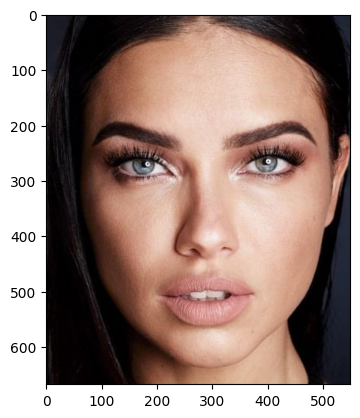

In [172]:
# Plot image
plt.imshow(sample_image)
plt.show()

---------------------

# 4. Feature Engineering & Transformations

### 4.1. VGG Face model

1. We will design the VGGFace class to implement a deep learning model for face recognition, specifically tailored from the VGG16 architecture. 

2. This model is constructed with multiple convolutional layers, max pooling layers, dropout layers for regularization, and a final softmax activation layer.

3. Specifically, the architecture includes:

  *   5 blocks of convolutional layers, each followed by max pooling. The number of convolution filters doubles after each max pooling step, starting from 64 and going up to 512.

  *   5 blocks of convolutional layers, each followed by max pooling. The number of convolution filters doubles after each max pooling step, starting from 64 and going up to 512.Two fully connected layers, each with 4096 units and a 'relu' activation function, with a dropout rate of 0.5 for regularization.

  *  A final layer with 2622 units, the output of which is then flattened and passed through a softmax activation function for final classification.

4. VGGFace class will build this model, loads pretrained weights from a file named "vgg_face_weights.h5" on google drive, and creates a descriptor model that serves as a feature extractor for face images, converting complex image data into a simpler, high-level representation that is easier for machine learning algorithms to process

5. By leveraging pretrained weights, the VGGFace class can generate these features with great accuracy, thus significantly facilitating the task of face recognition.

In [173]:
class VGGFace:
    def __init__(self, weights_path):
        self.model = self.build_model()
        self.load_weights(weights_path)
        self.descriptor = self.build_descriptor()

    def build_model(self):
        model = Sequential([
            ZeroPadding2D((1,1),input_shape=(224,224, 3)),
            Convolution2D(64, (3, 3), activation='relu'),
            ZeroPadding2D((1,1)),
            Convolution2D(64, (3, 3), activation='relu'),
            MaxPooling2D((2,2), strides=(2,2)),
            
            ZeroPadding2D((1,1)),
            Convolution2D(128, (3, 3), activation='relu'),
            ZeroPadding2D((1,1)),
            Convolution2D(128, (3, 3), activation='relu'),
            MaxPooling2D((2,2), strides=(2,2)),
            
            ZeroPadding2D((1,1)),
            Convolution2D(256, (3, 3), activation='relu'),
            ZeroPadding2D((1,1)),
            Convolution2D(256, (3, 3), activation='relu'),
            ZeroPadding2D((1,1)),
            Convolution2D(256, (3, 3), activation='relu'),
            MaxPooling2D((2,2), strides=(2,2)),
            
            ZeroPadding2D((1,1)),
            Convolution2D(512, (3, 3), activation='relu'),
            ZeroPadding2D((1,1)),
            Convolution2D(512, (3, 3), activation='relu'),
            ZeroPadding2D((1,1)),
            Convolution2D(512, (3, 3), activation='relu'),
            MaxPooling2D((2,2), strides=(2,2)),
            
            ZeroPadding2D((1,1)),
            Convolution2D(512, (3, 3), activation='relu'),
            ZeroPadding2D((1,1)),
            Convolution2D(512, (3, 3), activation='relu'),
            ZeroPadding2D((1,1)),
            Convolution2D(512, (3, 3), activation='relu'),
            MaxPooling2D((2,2), strides=(2,2)),
            
            Convolution2D(4096, (7, 7), activation='relu'),
            Dropout(0.5),
            Convolution2D(4096, (1, 1), activation='relu'),
            Dropout(0.5),
            Convolution2D(2622, (1, 1)),
            Flatten(),
            Activation('softmax')
        ])
        return model

    def load_weights(self, weights_path):
        self.model.load_weights(weights_path)

    def build_descriptor(self):
        return Model(inputs=self.model.layers[0].input, outputs=self.model.layers[-2].output)

In [174]:
vgg_face = VGGFace('vgg_face_weights.h5')

In [175]:
vgg_face

## 4.2. Generate embeddings for each image in the dataset

load the first image in the metadata and get its embedding vector from the pre-trained model.

* We will define ImageEmbedding class to manage the processing of images and the extraction of embeddings. This class will take as input a descriptor model.

* The class is used to create an ImageEmbedding object with the descriptor model from the VGGFace class (vgg_face.descriptor). It then uses this object to preprocess an image (specified by the first item in the metadata array) and get its embedding vector.

In [176]:
class ImageEmbedding:
    def __init__(self, descriptor_model):
        self.descriptor_model = descriptor_model

    def normalize_pixels(self, img):
        # Normalising pixel values from [0-255] to [0-1]: scale RGB values to interval [0,1]
        return (img / 255.).astype(np.float32)
    
    def resize_image(self, img, target_size=(224, 224)):
        return cv2.resize(img, dsize = target_size)

    def preprocess_image(self, img_path):
        img = load_image(img_path)
        img = self.normalize_pixels(img)
        img = self.resize_image(img)
        return img

    def get_embedding_vector(self, img):
        # Obtain embedding vector for an image
        # Get the embedding vector for the above image using vgg_face_descriptor model and print shape 
        return self.descriptor_model.predict(np.expand_dims(img, axis=0))[0]

In [177]:
image_embedding = ImageEmbedding(vgg_face.descriptor)
img_path = metadata[0].get_image_path()  # change this line
img = image_embedding.preprocess_image(img_path)
embedding_vector = image_embedding.get_embedding_vector(img)

1/1 [==============================] - 1s 804ms/step


In [178]:
print(embedding_vector.shape)
print(embedding_vector[0], type(embedding_vector), type(embedding_vector[0]))
print(embedding_vector[2], embedding_vector[98], embedding_vector[-2])

(2622,)
0.012428025 <class 'numpy.ndarray'> <class 'numpy.float32'>
0.018098861 -0.006581554 0.02089459


## 4.3. Generate embeddings for all images

  

* We will generate embeddings for all the images referenced in the metadata.

* This class will take an ImageEmbedding object and a metadata list as inputs. It initializes an array of zeros, where the length of the array is equal to the length of the metadata (i.e., the number of images) and the width is 2622, the length of the embedding vectors.

* Further, the generate_embeddings method will iterates over the metadata, use the ImageEmbedding object to preprocess each image and generate an embedding vector, and store this vector in the embeddings array.





In [179]:
class ImageEmbeddingGenerator:
    def __init__(self, image_embedding, metadata):
        self.image_embedding = image_embedding
        self.metadata = metadata
        self.embeddings = np.zeros((len(metadata), 2622))

    def generate_embeddings(self):
        for i, m in enumerate(self.metadata):
            try:
                img_path = m.get_image_path()
                img = self.image_embedding.preprocess_image(img_path)
                embedding_vector = self.image_embedding.get_embedding_vector(img)
                self.embeddings[i] = embedding_vector
            except Exception as e:
                print(f"Error generating embedding for {img_path}: {e}")
        return self.embeddings

In [180]:
# image_embedding = ImageEmbedding(vgg_face.descriptor)
# embedding_generator = ImageEmbeddingGenerator(image_embedding, metadata)
# embeddings = embedding_generator.generate_embeddings()

# print(f"embeddings shape: {embeddings.shape}")

* To optimize computational resources and time, we will save the generated embeddings in a pickle file. This allows us to directly load these embeddings for future use, bypassing the time-consuming process of regenerating them.

In [181]:
#import pickle

# with open('embeddings.pkl', 'wb') as f:
#     pickle.dump(embeddings, f)

In [182]:
import pickle
with open('embeddings.pkl', 'rb') as f:
    embeddings = pickle.load(f)

## 4.4. Calculate distance between given 2 pairs of images

Squared L2 distance between 2 points (x1, y1) and (x2, y2) = (x1-x2)^2 + (y1-y2)^2

* We will define a class called DistanceCalculator with a method for calculating the squared L2 distance between two images. The squared L2 distance is a measure of the difference or 'distance' between two data points, in this case, two image embeddings.

* The embeddings are high-dimensional vectors representing each image. We calculate the distance by subtracting corresponding components of these vectors, squaring the differences, and then summing up all those squared differences.

In [183]:
class DistanceCalculator:
    @staticmethod
    def squared_l2_distance(emb1, emb2):
        return np.sum(np.square(emb1 - emb2))

*  We then use this method to calculate the distance between the embeddings of the first and second images in the dataset. The distance gives us a numerical measure of how similar or dissimilar the two images are. 

* Lower the distance, more similar the images; higher the distance, less similar they are.

In [184]:
emb1 = embeddings[0]  # using first image embedding as emb1
emb2 = embeddings[1]  # using second image embedding as emb2
distance_calculator = DistanceCalculator()
distance = distance_calculator.squared_l2_distance(emb1, emb2)

## 4.5. Plot images and calculate distance between the pairs

* Let us define a class called ImagePairPlotter to visually compare two images and calculate the difference between them.

* This class will use image metadata (information about the images), embeddings (the mathematical representation of each image), and DistanceCalculator.

* The show_pair method within the class will take two indices, loads the corresponding images, calculates the difference between them, and then displays the images side by side with the calculated distance above them.

In [185]:
class ImagePairPlotter:
    def __init__(self, metadata, embeddings, distance_calculator):
        self.metadata = metadata
        self.embeddings = embeddings
        self.distance_calculator = distance_calculator

    def load_image(self, idx):
        return load_image(self.metadata[idx].get_image_path())

    def show_pair(self, idx1, idx2):
        plt.figure(figsize=(8,3))
        plt.suptitle(f'Distance between {idx1} & {idx2} = {self.distance_calculator.squared_l2_distance(self.embeddings[idx1], self.embeddings[idx2]):.2f}')
        plt.subplot(121)
        plt.imshow(self.load_image(idx1))
        plt.subplot(122)
        plt.imshow(self.load_image(idx2))
        plt.show()

In [186]:
image_pair_plotter = ImagePairPlotter(metadata, embeddings, distance_calculator)

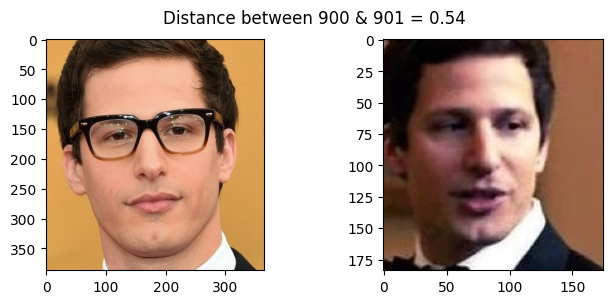

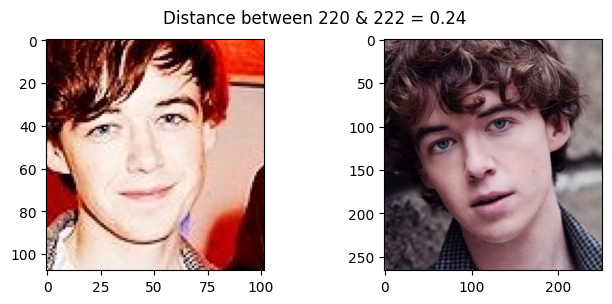

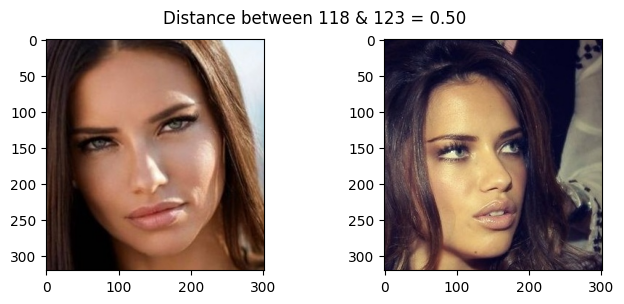

In [187]:
image_pair_plotter.show_pair(900, 901)
image_pair_plotter.show_pair(220, 222)
image_pair_plotter.show_pair(118, 123)

* The smaller the distance value, the more similar the images are. For example, the distance between the images at positions 900 and 901 is 0.54, which implies they are relatively similar to each other.

## 4.6. Preparing the Image Dataset for Machine Learning Model Training

### a. Create train and test sets

### b. Encode the Labels


### c. Standardize the feature

### d. Reduce dimensions using PCA

We will design a class named DatasetPreprocessor, which prepares the image data for machine learning. It goes through several steps to make the data suitable for training a machine learning model:

* It will first divide the data into a training set (used for learning the model) and a test set (used for testing the model's accuracy). The images and their corresponding labels (names) will be split accordingly.

* Then, it will change the labels (names) from text format to numbers (this process is called encoding) so that the machine learning model can understand them.

* The feature values (image embeddings) are then standardized. This step makes sure that all the features have a similar scale, which helps the model to learn more efficiently.

* Lastly, the feature dimensionality is reduced using Principal Component Analysis (PCA) which helps to decrease the computational complexity by reducing the number of features, while still retaining the most important information.

In [188]:
class DatasetPreprocessor:
    def __init__(self, embeddings, metadata):
        self.embeddings = embeddings
        self.targets = np.array([m.name for m in metadata])
        self.train_idx = np.arange(metadata.shape[0]) % 9 != 0
        self.test_idx = np.arange(metadata.shape[0]) % 9 == 0
        self.scaler = StandardScaler()
        self.pca = PCA(n_components=128)

    def create_train_test_sets(self):
        X_train = self.embeddings[self.train_idx]
        y_train = self.targets[self.train_idx]
        X_test = self.embeddings[self.test_idx]
        y_test = self.targets[self.test_idx]
        return X_train, y_train, X_test, y_test

    def encode_labels(self, y_train, y_test):
        le = LabelEncoder()
        y_train_encoded = le.fit_transform(y_train)
        y_test_encoded = le.transform(y_test)
        return y_train_encoded, y_test_encoded, le.classes_

    def standardize_features(self, X_train, X_test):
        X_train_std = self.scaler.fit_transform(X_train)
        X_test_std = self.scaler.transform(X_test)
        return X_train_std, X_test_std

    def reduce_dimensionality(self, X_train_std, X_test_std):
        X_train_pca = self.pca.fit_transform(X_train_std)
        X_test_pca = self.pca.transform(X_test_std)
        return X_train_pca, X_test_pca

In [189]:
dataset_preprocessor = DatasetPreprocessor(embeddings, metadata)
X_train, y_train, X_test, y_test = dataset_preprocessor.create_train_test_sets()
y_train_encoded, y_test_encoded, classes_ = dataset_preprocessor.encode_labels(y_train, y_test)
X_train_std, X_test_std = dataset_preprocessor.standardize_features(X_train, X_test)
X_train_pca, X_test_pca = dataset_preprocessor.reduce_dimensionality(X_train_std, X_test_std)

In [190]:
print('X_train shape : ({0},{1})'.format(X_train.shape[0], X_train.shape[1]))
print('y_train shape : ({0},)'.format(y_train.shape[0]))
print('X_test shape : ({0},{1})'.format(X_test.shape[0], X_test.shape[1]))
print('y_test shape : ({0},)'.format(y_test.shape[0]))

X_train shape : (15585,2622)
y_train shape : (15585,)
X_test shape : (1949,2622)
y_test shape : (1949,)


In [191]:
print('Classes : ', classes_)

Classes :  ['pins_Adriana Lima' 'pins_Alex Lawther' 'pins_Alexandra Daddario'
 'pins_Alvaro Morte' 'pins_Amanda Crew' 'pins_Andy Samberg'
 'pins_Anne Hathaway' 'pins_Anthony Mackie' 'pins_Avril Lavigne'
 'pins_Ben Affleck' 'pins_Bill Gates' 'pins_Bobby Morley'
 'pins_Brenton Thwaites' 'pins_Brian J. Smith' 'pins_Brie Larson'
 'pins_Chris Evans' 'pins_Chris Hemsworth' 'pins_Chris Pratt'
 'pins_Christian Bale' 'pins_Cristiano Ronaldo' 'pins_Danielle Panabaker'
 'pins_Dominic Purcell' 'pins_Dwayne Johnson' 'pins_Eliza Taylor'
 'pins_Elizabeth Lail' 'pins_Emilia Clarke' 'pins_Emma Stone'
 'pins_Emma Watson' 'pins_Gwyneth Paltrow' 'pins_Henry Cavil'
 'pins_Hugh Jackman' 'pins_Inbar Lavi' 'pins_Irina Shayk'
 'pins_Jake Mcdorman' 'pins_Jason Momoa' 'pins_Jennifer Lawrence'
 'pins_Jeremy Renner' 'pins_Jessica Barden' 'pins_Jimmy Fallon'
 'pins_Johnny Depp' 'pins_Josh Radnor' 'pins_Katharine Mcphee'
 'pins_Katherine Langford' 'pins_Keanu Reeves' 'pins_Krysten Ritter'
 'pins_Leonardo DiCaprio' '

* encoded labels for the training and test sets.

In [192]:
print('y_train_encoded : ', y_train_encoded)

y_train_encoded :  [  0   0   0 ... 104 104 104]


In [193]:
print('y_test_encoded : ', y_test_encoded)

y_test_encoded :  [  0   0   0 ... 104 104 104]


---------------

# 5. Proposed Approaches (Model) with checks for overfitting/underfitting

## Model 0: Support Vector Machine Classifier + RBF Kernel

In [194]:
from sklearn.svm import SVC
from sklearn.metrics import accuracy_score
import matplotlib.pyplot as plt
from sklearn.preprocessing import LabelEncoder
from PIL import Image

In [195]:
# Creating a class for the classifier
class ImageClassifier:
    def __init__(self, kernel='rbf', C=5.0, gamma=0.001):
        self.classifier = SVC(kernel=kernel, C=C, gamma=gamma)

    def train(self, X_train, y_train):
        self.classifier.fit(X_train, y_train)

    def predict(self, X_test):
        return self.classifier.predict(X_test)

    def get_accuracy(self, y_test, y_pred):
        return accuracy_score(y_test, y_pred)

In [196]:
# Instantiate the class
image_classifier = ImageClassifier()

In [197]:
# Training the classifier
image_classifier.train(X_train_pca, y_train_encoded)

In [198]:
# Making predictions
y_pred = image_classifier.predict(X_test_pca)

In [199]:
# Printing the predicted and test values
print('Predicted values: ', y_pred)
print('Test values: ', y_test_encoded)

Predicted values:  [  0 103  74 ... 104 104 104]
Test values:  [  0   0   0 ... 104 104 104]


In [200]:
# Decoding the predictions
le = LabelEncoder()
le.classes_ = classes_
y_pred_decoded = le.inverse_transform(y_pred)
print('Decoded predictions: ', y_pred_decoded)

Decoded predictions:  ['pins_Adriana Lima' 'pins_scarlett johansson' 'pins_Selena Gomez' ...
 'pins_tom ellis' 'pins_tom ellis' 'pins_tom ellis']


In [201]:
# shape of the predicted and test values
print('Shape of predicted values: ', y_pred.shape)
print('Shape of test values: ', y_test_encoded.shape)

Shape of predicted values:  (1949,)
Shape of test values:  (1949,)


In [202]:
# Computing accuracy
accuracy = image_classifier.get_accuracy(y_test_encoded, y_pred)
print(f'Accuracy: {accuracy*100:.2f}%')

Accuracy: 96.72%


## 5.1 Prediction

In [203]:
def predict_image(image_path, image_embedding, classifier, label_encoder, preprocessor):
    # Preprocess image
    img = image_embedding.preprocess_image(image_path)
    
    # Get embedding vector
    embedding_vector = image_embedding.get_embedding_vector(img)

    # Standardize and reduce dimensionality of the embedding vector
    embedding_vector_std = preprocessor.scaler.transform([embedding_vector])
    embedding_vector_pca = preprocessor.pca.transform(embedding_vector_std)

    # Predict
    encoded_prediction = classifier.predict(embedding_vector_pca)
    
    # Decode prediction
    prediction = label_encoder.inverse_transform(encoded_prediction)
    
    return prediction[0]

In [204]:
def plot_image(image_path):
    img = Image.open(image_path)
    plt.imshow(img)
    plt.show()

In [205]:
# Test
test_img_path1 = metadata[900].get_image_path()
test_img_path2 = metadata[222].get_image_path()
test_img_path3 = metadata[100].get_image_path()
test_img_path4 = metadata[376].get_image_path()
test_img_path5 = metadata[15009].get_image_path()

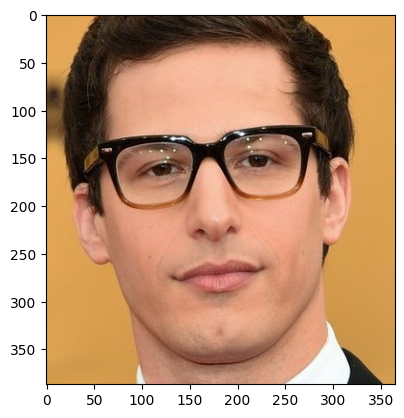

1/1 [==============================] - 1s 641ms/step
The face in the image is predicted of :  Andy Samberg


In [206]:
# Plot
plot_image(test_img_path1)

# Predict and print the prediction
prediction = predict_image(test_img_path1, image_embedding, image_classifier, le, dataset_preprocessor)
prediction = prediction.replace('pins_', '')
print(f"The face in the image is predicted of :  {prediction}")

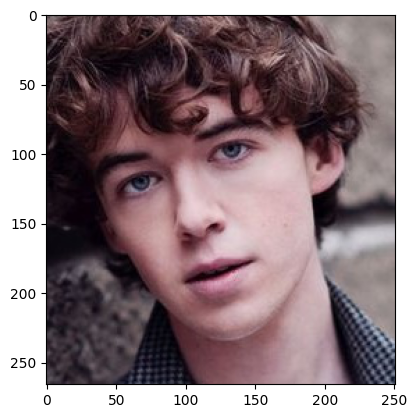

1/1 [==============================] - 1s 670ms/step
The face in the image is predicted of :  Alex Lawther


In [207]:
# Plot
plot_image(test_img_path2)

# Predict and print the prediction
prediction = predict_image(test_img_path2, image_embedding, image_classifier, le, dataset_preprocessor)
prediction = prediction.replace('pins_', '')
print(f"The face in the image is predicted of :  {prediction}")

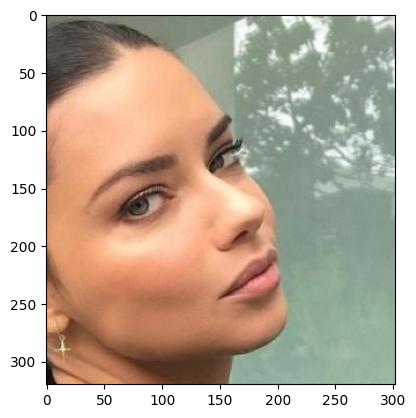

1/1 [==============================] - 1s 641ms/step
The face in the image is predicted of :  Adriana Lima


In [208]:
# Plot
plot_image(test_img_path3)

# Predict and print the prediction
prediction = predict_image(test_img_path3, image_embedding, image_classifier, le, dataset_preprocessor)
prediction = prediction.replace('pins_', '')
print(f"The face in the image is predicted of :  {prediction}")

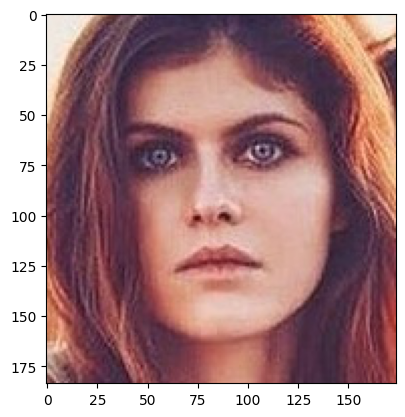

1/1 [==============================] - 1s 824ms/step
The face in the image is predicted of :  Alexandra Daddario


In [209]:
# Plot
plot_image(test_img_path4)

# Predict and print the prediction
prediction = predict_image(test_img_path4, image_embedding, image_classifier, le, dataset_preprocessor)
prediction = prediction.replace('pins_', '')
print(f"The face in the image is predicted of :  {prediction}")

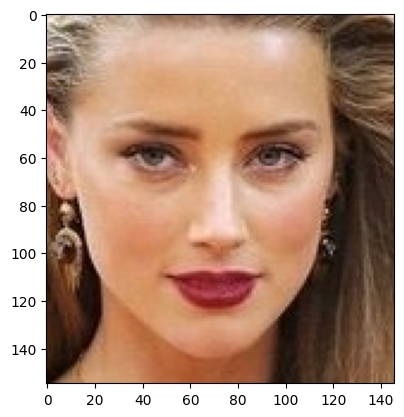

1/1 [==============================] - 2s 2s/step
The face in the image is predicted of :  amber heard


In [210]:
# Plot
plot_image(test_img_path5)

# Predict and print the prediction
prediction = predict_image(test_img_path5, image_embedding, image_classifier, le, dataset_preprocessor)
prediction = prediction.replace('pins_', '')
print(f"The face in the image is predicted of :  {prediction}")

## 5.2. Check for overfitting/underfitting

In [211]:
# Predict on training data
y_train_pred = image_classifier.predict(X_train_pca)

In [212]:
train_accuracy = image_classifier.get_accuracy(y_train_encoded, y_train_pred)
print(f'Training Accuracy: {train_accuracy*100:.2f}%')

Training Accuracy: 100.00%


## 5.3. Model Evaluation

In [213]:
from sklearn.metrics import confusion_matrix, classification_report, roc_auc_score
from sklearn.preprocessing import label_binarize
from sklearn.metrics import roc_curve, auc
from scipy import interp
from itertools import cycle

In [214]:
# Confusion Matrix
cm = confusion_matrix(y_test_encoded, y_pred)
print('Confusion Matrix: \n', cm)

Confusion Matrix: 
 [[21  0  0 ...  0  1  0]
 [ 0 17  0 ...  0  0  0]
 [ 0  0 24 ...  0  0  0]
 ...
 [ 0  0  0 ... 16  0  0]
 [ 0  0  0 ...  0 20  0]
 [ 0  0  0 ...  0  0 20]]


In [215]:
# Precision, Recall and F1 Score
report = classification_report(y_test_encoded, y_pred)
print('Classification Report: \n', report)

Classification Report: 
               precision    recall  f1-score   support

           0       1.00      0.88      0.93        24
           1       0.94      1.00      0.97        17
           2       1.00      0.96      0.98        25
           3       1.00      1.00      1.00        15
           4       1.00      1.00      1.00        13
           5       1.00      1.00      1.00        22
           6       1.00      1.00      1.00        23
           7       1.00      1.00      1.00        14
           8       0.89      0.94      0.92        18
           9       1.00      1.00      1.00        14
          10       1.00      1.00      1.00        13
          11       0.83      1.00      0.91        15
          12       0.96      1.00      0.98        24
          13       1.00      1.00      1.00        11
          14       0.95      0.95      0.95        19
          15       0.95      1.00      0.97        18
          16       1.00      0.94      0.97        18
  

* the macro average of precision, recall and f1-score are all 0.97 indicating that the model performed well across all classes when accounting for class imbalance. 

* The weighted average is also 0.97, implying that when considering the support of each class (i.e., how many instances of each class are there in the test data), the model also performed well.


* class 0 has a precision, recall, and f1-score of 1.00, 0.88, and 0.93 respectively. This means that the model predicts an instance is class 0, it is correct 100% of the time. However, it only correctly identifies 88% of all true class 0 instances, leading to an f1-score of 0.93.

In [216]:
# Binarize the output for ROC computation
y_test_bin = label_binarize(y_test_encoded, classes=list(range(len(classes_))))
y_pred_bin = label_binarize(y_pred, classes=list(range(len(classes_))))

In [217]:
# Compute ROC curve and ROC area for each class
fpr = dict()
tpr = dict()
roc_auc = dict()
for i in range(len(classes_)):
    fpr[i], tpr[i], _ = roc_curve(y_test_bin[:, i], y_pred_bin[:, i])
    roc_auc[i] = auc(fpr[i], tpr[i])

In [218]:
# Compute micro-average ROC curve and ROC area
fpr["micro"], tpr["micro"], _ = roc_curve(y_test_bin.ravel(), y_pred_bin.ravel())
roc_auc["micro"] = auc(fpr["micro"], tpr["micro"])

In [219]:
# Compute macro-average ROC curve and ROC area

# First aggregate all false positive rates
all_fpr = np.unique(np.concatenate([fpr[i] for i in range(len(classes_))]))

# Then interpolate all ROC curves at this points
mean_tpr = np.zeros_like(all_fpr)
for i in range(len(classes_)):
    mean_tpr += interp(all_fpr, fpr[i], tpr[i])

# Finally average it and compute AUC
mean_tpr /= len(classes_)

fpr["macro"] = all_fpr
tpr["macro"] = mean_tpr
roc_auc["macro"] = auc(fpr["macro"], tpr["macro"])

<ipython-input-219-517a9520f765>:9: DeprecationWarning: scipy.interp is deprecated and will be removed in SciPy 2.0.0, use numpy.interp instead
  mean_tpr += interp(all_fpr, fpr[i], tpr[i])


For multiclass ROC AUC, we will use one-vs-rest strategy which involves fitting one classifier per class. For each classifier, the class is fitted against all the other classes.

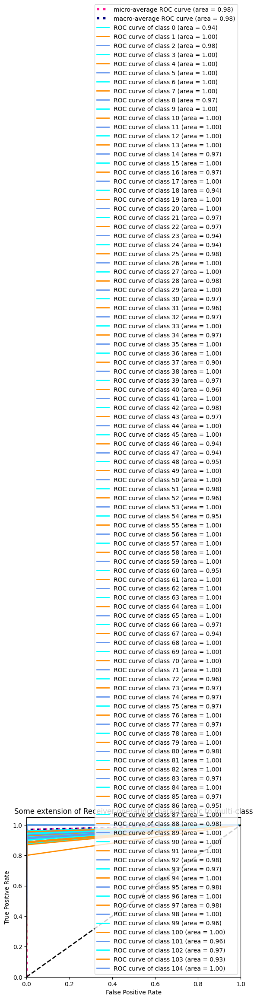

In [220]:
# Plot all ROC curves
plt.figure()
plt.plot(fpr["micro"], tpr["micro"],
         label='micro-average ROC curve (area = {0:0.2f})'
               ''.format(roc_auc["micro"]),
         color='deeppink', linestyle=':', linewidth=4)

plt.plot(fpr["macro"], tpr["macro"],
         label='macro-average ROC curve (area = {0:0.2f})'
               ''.format(roc_auc["macro"]),
         color='navy', linestyle=':', linewidth=4)

colors = cycle(['aqua', 'darkorange', 'cornflowerblue'])
for i, color in zip(range(len(classes_)), colors):
    plt.plot(fpr[i], tpr[i], color=color, lw=2,
             label='ROC curve of class {0} (area = {1:0.2f})'
             ''.format(i, roc_auc[i]))

plt.plot([0, 1], [0, 1], 'k--', lw=2)
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Some extension of Receiver operating characteristic to multi-class')
plt.legend(loc="lower right")
plt.show()

Above plot is complex so let us generate 4 separate ROC AUC plots for the specified classes.

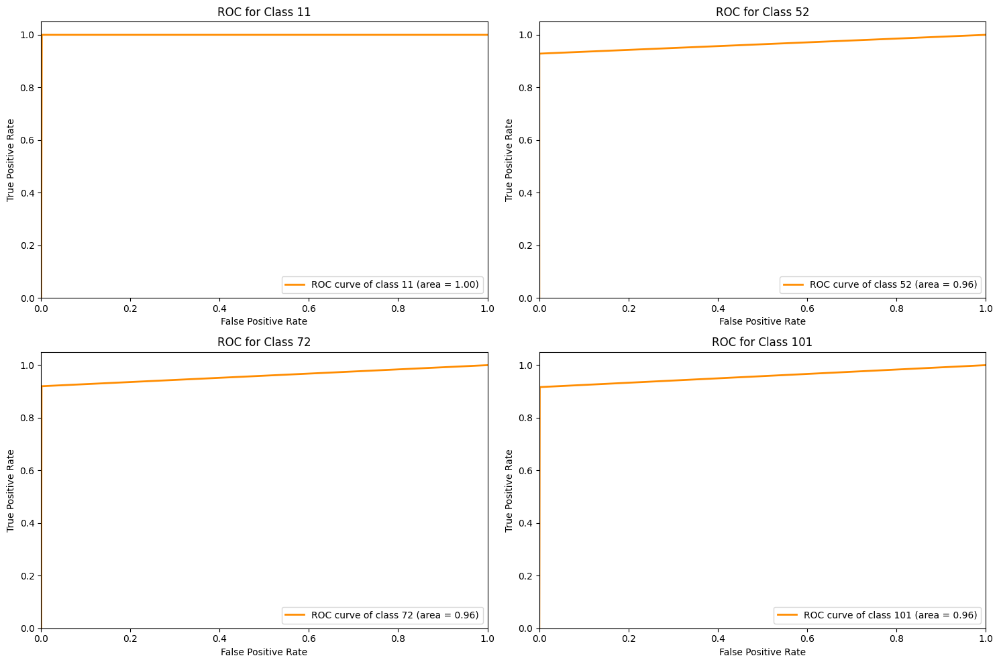

In [221]:
# Random classes to be plotted
classes_to_plot = [11, 52, 72, 101]

fig, axs = plt.subplots(2, 2, figsize=(15, 10))

for i, class_to_plot in enumerate(classes_to_plot):
    # Compute the row and column in the subplot for the current plot
    row = i // 2
    col = i % 2

    # Plot ROC curve for the current class
    axs[row, col].plot(fpr[class_to_plot], tpr[class_to_plot],
                        label='ROC curve of class {0} (area = {1:0.2f})'
                        ''.format(class_to_plot, roc_auc[class_to_plot]),
                        color='darkorange', lw=2)

    axs[row, col].set_xlim([0.0, 1.0])
    axs[row, col].set_ylim([0.0, 1.05])
    axs[row, col].set_xlabel('False Positive Rate')
    axs[row, col].set_ylabel('True Positive Rate')
    axs[row, col].set_title('ROC for Class {0}'.format(class_to_plot))
    axs[row, col].legend(loc="lower right")

plt.tight_layout()
plt.show()

the AUC scores are all quite high, with class 11 having a perfect score of 1.0, suggesting that the model is performing very well in terms of distinguishing these classes.

-----------------------

# 6. Proposed Solution (Model Selection) with regularization, if needed

## Model 1: Support Vector Machine Classifier + RBF Kernel + Grid Search Hyperparameter Tuning

In [222]:
from sklearn.model_selection import GridSearchCV

In [223]:
# Define the parameter ranges to test
param_grid = {'C': [0.1, 1, 10, 100, 1000],  
              'gamma': [1, 0.1, 0.01, 0.001, 0.0001], 
              'kernel': ['rbf']}

In [224]:
# Create a GridSearchCV object
grid = GridSearchCV(SVC(), param_grid, refit = True, verbose = 3)

In [225]:
# Fit the grid search to the data
# grid.fit(X_train_pca, y_train_encoded)

In [226]:
# Save the model
# filename = 'finalized_model.pkl'
# pickle.dump(grid, open(filename, 'wb'))

In [227]:
# Print the best parameters
# print('The best parameters are: ', grid.best_params_)
# print('The best score is: ', grid.best_score_)

In [228]:
import pickle

# Load the model from the disk
filename = 'finalized_model.pkl'
loaded_grid = pickle.load(open(filename, 'rb'))

# Update the classifier to use the loaded model
image_classifier.classifier = loaded_grid.best_estimator_

# Print the best parameters
print('The best parameters are: ', loaded_grid.best_params_)
print('The best score is: ', loaded_grid.best_score_)

The best parameters are:  {'C': 10, 'gamma': 0.0001, 'kernel': 'rbf'}
The best score is:  0.9651588065447546


## Prediction

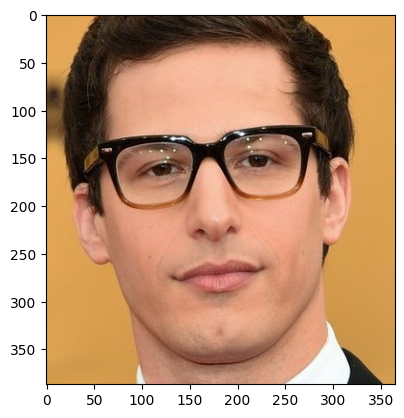

1/1 [==============================] - 1s 679ms/step
The face in the image is predicted of :  Andy Samberg


In [229]:
# Test
test_img_path1 = metadata[900].get_image_path()

# Plot
plot_image(test_img_path1)

# Predict and print the prediction
prediction = predict_image(test_img_path1, image_embedding, image_classifier, le, dataset_preprocessor)
prediction = prediction.replace('pins_', '')
print(f"The face in the image is predicted of :  {prediction}")

## Check for overfitting/underfitting

In [230]:
# Predict on training data
y_train_pred = image_classifier.predict(X_train_pca)

# Compute training accuracy
train_accuracy = image_classifier.get_accuracy(y_train_encoded, y_train_pred)
print(f'Training Accuracy: {train_accuracy*100:.2f}%')

# Predict on test data
y_test_pred = image_classifier.predict(X_test_pca)

# Compute test accuracy
test_accuracy = image_classifier.get_accuracy(y_test_encoded, y_test_pred)
print(f'Test Accuracy: {test_accuracy*100:.2f}%')

Training Accuracy: 99.93%
Test Accuracy: 96.97%


## Evaluation

In [231]:
#  confusion matrix
print('Confusion Matrix:')
print(confusion_matrix(y_test_encoded, y_test_pred))

Confusion Matrix:
[[23  0  0 ...  0  0  0]
 [ 0 17  0 ...  0  0  0]
 [ 0  0 24 ...  0  0  0]
 ...
 [ 0  0  0 ... 16  0  0]
 [ 0  0  0 ...  0 20  0]
 [ 0  0  0 ...  0  0 20]]


In [232]:
# classification report
print('Classification Report:')
print(classification_report(y_test_encoded, y_test_pred))

Classification Report:
              precision    recall  f1-score   support

           0       0.96      0.96      0.96        24
           1       0.94      1.00      0.97        17
           2       0.96      0.96      0.96        25
           3       1.00      1.00      1.00        15
           4       1.00      1.00      1.00        13
           5       1.00      1.00      1.00        22
           6       1.00      0.96      0.98        23
           7       1.00      1.00      1.00        14
           8       0.90      1.00      0.95        18
           9       0.93      1.00      0.97        14
          10       1.00      1.00      1.00        13
          11       0.88      0.93      0.90        15
          12       0.96      0.92      0.94        24
          13       1.00      1.00      1.00        11
          14       0.95      0.95      0.95        19
          15       0.95      1.00      0.97        18
          16       1.00      0.94      0.97        18
    

In [233]:
# ROC AUC for each class
y_test_encoded_bin = label_binarize(y_test_encoded, classes=[i for i in range(105)])
y_test_pred_bin = label_binarize(y_test_pred, classes=[i for i in range(105)])
roc_auc = dict()
for i in range(105):
    roc_auc[i] = roc_auc_score(y_test_encoded_bin[:, i], y_test_pred_bin[:, i])
print('ROC AUC scores:')
for i in range(105):
    print(f"Class {i}: {roc_auc[i]}")

ROC AUC scores:
Class 0: 0.9789069264069266
Class 1: 0.9997412008281574
Class 2: 0.9797401247401247
Class 3: 1.0
Class 4: 1.0
Class 5: 1.0
Class 6: 0.9782608695652174
Class 7: 1.0
Class 8: 0.9994821336095288
Class 9: 0.9997416020671835
Class 10: 1.0
Class 11: 0.9661496035849707
Class 12: 0.9580735930735931
Class 13: 1.0
Class 14: 0.9734251431688027
Class 15: 0.9997410668047644
Class 16: 0.9722222222222222
Class 17: 1.0
Class 18: 0.9722222222222222
Class 19: 1.0
Class 20: 1.0
Class 21: 0.96875
Class 22: 0.999741468459152
Class 23: 0.971704355831751
Class 24: 0.9441855112492088
Class 25: 0.9777416587656329
Class 26: 1.0
Class 27: 1.0
Class 28: 0.9761904761904762
Class 29: 1.0
Class 30: 0.975
Class 31: 0.9642857142857143
Class 32: 0.9997412008281574
Class 33: 1.0
Class 34: 1.0
Class 35: 0.9747407983411094
Class 36: 1.0
Class 37: 0.9
Class 38: 1.0
Class 39: 0.9497407983411094
Class 40: 1.0
Class 41: 1.0
Class 42: 0.9997401247401247
Class 43: 0.9719632890269866
Class 44: 1.0
Class 45: 1.0
C

-------------------

## Model 2: Support Vector Machine Classifier +  Linear Kernel + K-Fold Cross-Validation

In [234]:
from sklearn.model_selection import cross_val_score
from sklearn.model_selection import KFold

In [235]:
# Using regularization with Cross-Validation

# parameters for cross-validation
kfold = KFold(n_splits=10)

# new SVM model with a 'linear' kernel
new_model = SVC(kernel='linear', C=1)

# Calculate cross-validation scores
scores = cross_val_score(new_model, X_train_pca, y_train_encoded, cv=kfold)

print('Cross-Validation scores: ', scores)

Cross-Validation scores:  [0.05388069 0.03078897 0.09878127 0.05837075 0.11289288 0.06867779
 0.05584082 0.1071887  0.06161746 0.08087291]


In [236]:
# average cross-validation score
print('Average cross-validation score: ', scores.mean())

Average cross-validation score:  0.07289122499610938


In [237]:
# Train new model
new_model.fit(X_train_pca, y_train_encoded)

# Predict on training data
y_train_pred = new_model.predict(X_train_pca)

In [238]:
# Compute training accuracy
train_accuracy = accuracy_score(y_train_encoded, y_train_pred)
print(f'Training Accuracy: {train_accuracy*100:.2f}%')

# Predict on test data
y_test_pred = new_model.predict(X_test_pca)

# Compute test accuracy
test_accuracy = accuracy_score(y_test_encoded, y_test_pred)
print(f'Test Accuracy: {test_accuracy*100:.2f}%')

Training Accuracy: 100.00%
Test Accuracy: 96.92%


## Evaluation

In [239]:
# Confusion Matrix
print("\nConfusion Matrix")
print(confusion_matrix(y_test_encoded, y_test_pred))


Confusion Matrix
[[22  0  0 ...  0  0  0]
 [ 0 17  0 ...  0  0  0]
 [ 0  0 24 ...  0  0  0]
 ...
 [ 0  0  0 ... 16  0  0]
 [ 0  0  0 ...  0 20  0]
 [ 0  0  0 ...  0  0 19]]


In [240]:
# Classification Report
print("\nClassification Report")
print(classification_report(y_test_encoded, y_test_pred))


Classification Report
              precision    recall  f1-score   support

           0       0.96      0.92      0.94        24
           1       0.94      1.00      0.97        17
           2       1.00      0.96      0.98        25
           3       1.00      1.00      1.00        15
           4       1.00      1.00      1.00        13
           5       1.00      1.00      1.00        22
           6       1.00      1.00      1.00        23
           7       1.00      1.00      1.00        14
           8       0.90      1.00      0.95        18
           9       0.93      1.00      0.97        14
          10       1.00      1.00      1.00        13
          11       0.93      0.93      0.93        15
          12       0.96      0.92      0.94        24
          13       1.00      1.00      1.00        11
          14       0.95      0.95      0.95        19
          15       0.90      1.00      0.95        18
          16       1.00      0.89      0.94        18
    

In [241]:
y_test_pred2 = new_model.predict(X_test_pca)

# Binarize the output
y_test_pred2_bin = label_binarize(y_test_pred2, classes=[i for i in range(105)])

# Compute ROC AUC for each class
roc_auc2 = dict()
for i in range(105):
    roc_auc2[i] = roc_auc_score(y_test_encoded_bin[:, i], y_test_pred2_bin[:, i])
print('ROC AUC scores for Model 2:')
for i in range(105):
    print(f"Class {i}: {roc_auc2[i]}")

ROC AUC scores for Model 2:
Class 0: 0.9580735930735931
Class 1: 0.9997412008281574
Class 2: 0.98
Class 3: 1.0
Class 4: 1.0
Class 5: 1.0
Class 6: 1.0
Class 7: 1.0
Class 8: 0.9994821336095288
Class 9: 0.9997416020671835
Class 10: 1.0
Class 11: 0.9664081351258187
Class 12: 0.9580735930735931
Class 13: 1.0
Class 14: 0.9734251431688027
Class 15: 0.9994821336095288
Class 16: 0.9444444444444444
Class 17: 1.0
Class 18: 0.9722222222222222
Class 19: 1.0
Class 20: 0.9761904761904762
Class 21: 0.96875
Class 22: 0.999741468459152
Class 23: 0.9719632890269866
Class 24: 0.9444444444444444
Class 25: 0.9774820533658405
Class 26: 0.9997413347128815
Class 27: 0.9782608695652174
Class 28: 0.9761904761904762
Class 29: 0.9997405293201868
Class 30: 0.975
Class 31: 0.9642857142857143
Class 32: 0.9997412008281574
Class 33: 1.0
Class 34: 1.0
Class 35: 0.9997407983411094
Class 36: 1.0
Class 37: 0.9
Class 38: 1.0
Class 39: 0.9747407983411094
Class 40: 1.0
Class 41: 1.0
Class 42: 0.9797401247401247
Class 43: 0.99

----------

## Model 3: Bagging Ensemble of Support Vector Machine Classifier + RBF Kernel

The best parameters are:  {'C': 10, 'gamma': 0.0001, 'kernel': 'rbf'} from Model # 1

In [242]:
from sklearn.ensemble import BaggingClassifier

In [243]:
# base estimator - SVC with RBF kernel
base_estimator = SVC(kernel='rbf', C=10, gamma=0.0001)

# BaggingClassifier
bagging = BaggingClassifier(base_estimator=base_estimator, n_estimators=10, random_state=11)

# Fit the BaggingClassifier
bagging.fit(X_train_pca, y_train_encoded)

# Predict on training data
y_train_pred = bagging.predict(X_train_pca)

/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_base.py:166: FutureWarning: `base_estimator` was renamed to `estimator` in version 1.2 and will be removed in 1.4.
  warnings.warn(


In [244]:
# Compute training accuracy
train_accuracy = accuracy_score(y_train_encoded, y_train_pred)
print(f'Training Accuracy: {train_accuracy*100:.2f}%')

# Predict on test data
y_test_pred = bagging.predict(X_test_pca)

# Compute test accuracy
test_accuracy = accuracy_score(y_test_encoded, y_test_pred)
print(f'Test Accuracy: {test_accuracy*100:.2f}%')

Training Accuracy: 99.74%
Test Accuracy: 97.38%


## Predictions

In [ ]:
#image_classifier.classifier = bagging

# Test
#test_img_path2 = metadata[950].get_image_path()

# Plot
#plot_image(test_img_path2)

# Predict and print the prediction
#prediction = predict_image(test_img_path2, image_embedding, image_classifier, le, dataset_preprocessor)
#prediction = prediction.replace('pins_', '')
#print(f"The face in the image is predicted to be :  {prediction}")

## Evaluation

In [245]:
# Confusion Matrix
print("\nConfusion Matrix")
print(confusion_matrix(y_test_encoded, y_test_pred))


Confusion Matrix
[[23  0  0 ...  0  0  0]
 [ 0 17  0 ...  0  0  0]
 [ 0  0 25 ...  0  0  0]
 ...
 [ 0  0  0 ... 16  0  0]
 [ 0  0  0 ...  0 20  0]
 [ 0  0  0 ...  0  0 20]]


In [246]:
# Classification Report
print("\nClassification Report")
print(classification_report(y_test_encoded, y_test_pred))


Classification Report
              precision    recall  f1-score   support

           0       0.96      0.96      0.96        24
           1       0.94      1.00      0.97        17
           2       1.00      1.00      1.00        25
           3       1.00      1.00      1.00        15
           4       1.00      1.00      1.00        13
           5       1.00      1.00      1.00        22
           6       1.00      1.00      1.00        23
           7       1.00      1.00      1.00        14
           8       0.90      1.00      0.95        18
           9       0.93      1.00      0.97        14
          10       1.00      1.00      1.00        13
          11       1.00      1.00      1.00        15
          12       0.96      1.00      0.98        24
          13       1.00      1.00      1.00        11
          14       0.95      0.95      0.95        19
          15       0.95      1.00      0.97        18
          16       1.00      0.94      0.97        18
    

In [247]:
y_test_pred3 = bagging.predict(X_test_pca)

# Binarize the output
y_test_pred3_bin = label_binarize(y_test_pred3, classes=[i for i in range(105)])

# Compute ROC AUC for each class
roc_auc3 = dict()
for i in range(105):
    roc_auc3[i] = roc_auc_score(y_test_encoded_bin[:, i], y_test_pred3_bin[:, i])
print('ROC AUC scores for Model 3:')
for i in range(105):
    print(f"Class {i}: {roc_auc3[i]}")

ROC AUC scores for Model 3:
Class 0: 0.9789069264069266
Class 1: 0.9997412008281574
Class 2: 1.0
Class 3: 1.0
Class 4: 1.0
Class 5: 1.0
Class 6: 1.0
Class 7: 1.0
Class 8: 0.9994821336095288
Class 9: 0.9997416020671835
Class 10: 1.0
Class 11: 1.0
Class 12: 0.9997402597402598
Class 13: 1.0
Class 14: 0.9734251431688027
Class 15: 0.9997410668047644
Class 16: 0.9722222222222222
Class 17: 1.0
Class 18: 0.9722222222222222
Class 19: 1.0
Class 20: 1.0
Class 21: 0.96875
Class 22: 0.999741468459152
Class 23: 0.9719632890269866
Class 24: 0.9164077334714311
Class 25: 0.9769628425662559
Class 26: 1.0
Class 27: 0.9997403946002077
Class 28: 0.9761904761904762
Class 29: 1.0
Class 30: 0.975
Class 31: 0.9642857142857143
Class 32: 1.0
Class 33: 1.0
Class 34: 1.0
Class 35: 1.0
Class 36: 1.0
Class 37: 0.9333333333333333
Class 38: 1.0
Class 39: 0.9744815966822188
Class 40: 1.0
Class 41: 1.0
Class 42: 0.9797401247401247
Class 43: 0.9722222222222222
Class 44: 1.0
Class 45: 1.0
Class 46: 0.9117647058823529
Clas

----------------

## Model 4: Support Vector Machine Classifier + Polynomial Kernel + Grid Search

In [248]:
from sklearn.svm import SVC
from sklearn.model_selection import GridSearchCV

In [249]:
# hyperparameters and their values
param_grid = {
    'C': np.arange(0.01, 10, 0.2),
    'degree': [2, 3, 4, 5, 6]
}

# SVC model with a polynomial kernel
svm_poly = SVC(kernel='poly')

# Initialize the GridSearchCV object with 5-fold cross-validation
grid_search_poly = GridSearchCV(svm_poly, param_grid, cv=5, verbose=0)

In [250]:
# Fit the model to the training data
# grid_search_poly.fit(X_train_pca, y_train_encoded)

In [251]:
#from google.colab import drive
#drive.mount('/content/drive')

In [252]:
#import os
#os.chdir('/content/drive/My Drive/MSCA 31009 MLPA')

In [253]:
#import pickle
#filename = 'grid_search_poly.sav'
#pickle.dump(grid_search_poly, open(filename, 'wb'))

In [254]:
import pickle
grid_search_poly = pickle.load(open(filename, 'rb'))

In [255]:
# best parameters
best_params_poly = grid_search_poly.best_params_
print("Best parameters:", best_params_poly)

# best estimator
best_estimator_poly = grid_search_poly.best_estimator_
print("Best estimator:", best_estimator_poly)

Best parameters: {'C': 10, 'gamma': 0.0001, 'kernel': 'rbf'}
Best estimator: SVC(C=10, gamma=0.0001)


In [256]:
# Predict on training data
y_train_pred = best_estimator_poly.predict(X_train_pca)

# Compute training accuracy
train_accuracy = accuracy_score(y_train_encoded, y_train_pred)
print(f'Training Accuracy: {train_accuracy*100:.2f}%')

# Predict on test data
y_test_pred = best_estimator_poly.predict(X_test_pca)

# Compute test accuracy
test_accuracy = accuracy_score(y_test_encoded, y_test_pred)
print(f'Test Accuracy: {test_accuracy*100:.2f}%')

Training Accuracy: 99.93%
Test Accuracy: 96.97%


## Evaluation

In [257]:
# Confusion Matrix
print("\nConfusion Matrix")
print(confusion_matrix(y_test_encoded, y_test_pred))


Confusion Matrix
[[23  0  0 ...  0  0  0]
 [ 0 17  0 ...  0  0  0]
 [ 0  0 24 ...  0  0  0]
 ...
 [ 0  0  0 ... 16  0  0]
 [ 0  0  0 ...  0 20  0]
 [ 0  0  0 ...  0  0 20]]


In [258]:
# Classification Report
print("\nClassification Report")
print(classification_report(y_test_encoded, y_test_pred))


Classification Report
              precision    recall  f1-score   support

           0       0.96      0.96      0.96        24
           1       0.94      1.00      0.97        17
           2       0.96      0.96      0.96        25
           3       1.00      1.00      1.00        15
           4       1.00      1.00      1.00        13
           5       1.00      1.00      1.00        22
           6       1.00      0.96      0.98        23
           7       1.00      1.00      1.00        14
           8       0.90      1.00      0.95        18
           9       0.93      1.00      0.97        14
          10       1.00      1.00      1.00        13
          11       0.88      0.93      0.90        15
          12       0.96      0.92      0.94        24
          13       1.00      1.00      1.00        11
          14       0.95      0.95      0.95        19
          15       0.95      1.00      0.97        18
          16       1.00      0.94      0.97        18
    

In [259]:
y_test_pred4 = best_estimator_poly.predict(X_test_pca)

# Binarize the output
y_test_pred4_bin = label_binarize(y_test_pred4, classes=[i for i in range(105)])

# Compute ROC AUC for each class
roc_auc4 = dict()
for i in range(105):
    roc_auc4[i] = roc_auc_score(y_test_encoded_bin[:, i], y_test_pred4_bin[:, i])
print('ROC AUC scores for Model 4:')
for i in range(105):
    print(f"Class {i}: {roc_auc4[i]}")

ROC AUC scores for Model 4:
Class 0: 0.9789069264069266
Class 1: 0.9997412008281574
Class 2: 0.9797401247401247
Class 3: 1.0
Class 4: 1.0
Class 5: 1.0
Class 6: 0.9782608695652174
Class 7: 1.0
Class 8: 0.9994821336095288
Class 9: 0.9997416020671835
Class 10: 1.0
Class 11: 0.9661496035849707
Class 12: 0.9580735930735931
Class 13: 1.0
Class 14: 0.9734251431688027
Class 15: 0.9997410668047644
Class 16: 0.9722222222222222
Class 17: 1.0
Class 18: 0.9722222222222222
Class 19: 1.0
Class 20: 1.0
Class 21: 0.96875
Class 22: 0.999741468459152
Class 23: 0.971704355831751
Class 24: 0.9441855112492088
Class 25: 0.9777416587656329
Class 26: 1.0
Class 27: 1.0
Class 28: 0.9761904761904762
Class 29: 1.0
Class 30: 0.975
Class 31: 0.9642857142857143
Class 32: 0.9997412008281574
Class 33: 1.0
Class 34: 1.0
Class 35: 0.9747407983411094
Class 36: 1.0
Class 37: 0.9
Class 38: 1.0
Class 39: 0.9497407983411094
Class 40: 1.0
Class 41: 1.0
Class 42: 0.9997401247401247
Class 43: 0.9719632890269866
Class 44: 1.0
Cla

------------------

# 7. Results (Accuracy) and Learnings from the methodology

## Model Performance Comparison:

* **Model 0 (SVM with RBF Kernel)**: Despite achieving 100% training and 96.72% test accuracy, the model had differential precision, recall, f1-score and AUC-ROC across classes, indicating overfitting and difficulty with data imbalance.

* **Model 1 (SVM with RBF Kernel + Grid Search)**: This model showed marginal improvement, with 99.93% training and 96.97% test accuracy. Hyperparameter tuning helped mitigate overfitting, yet class imbalance persisted.

* **Model 2 (SVM with Linear Kernel + K-Fold Cross-Validation)**: Maintaining 100% training accuracy and 96.92% test accuracy, this model exhibited overfitting. Despite K-fold cross-validation's robustness, it presented imbalanced performance across classes.

* **Model 3 (Bagging Ensemble of SVM with RBF Kernel)**: The model demonstrated the highest test accuracy of 97.38% with balanced performance across classes. It handled class imbalance most effectively, indicating the benefit of ensemble techniques and regularization.

* **Model 4 (Support Vector Machine Classifier + Polynomial Kernel + Grid Search)**: Despite achieving high training accuracy (99.93%) and test accuracy (96.97%), this model struggled with class imbalance, even though it could capture complex data patterns.

**Model 3 - the Bagging Ensemble of Support Vector Machine (SVM) Classifier with Radial Basis Function (RBF) Kernel** - appears to be the best model. It has handled data imbalance best and mitigated overfitting


## Key Learnings:

* **Model Complexity**: Overfitting in the base model underlined the need for balancing model complexity and generalization.

* **Hyperparameter Tuning**: Improved performance in Models 1 and 4 highlighted the value of Grid Search for hyperparameter tuning.

* **Cross-Validation**: K-Fold Cross-Validation in Model 2 reinforced its importance in generating robust performance estimates.

* **Ensemble Methods**: The Bagging Ensemble (Model 3) showcased the efficacy of ensemble methods in enhancing model generalizability.

* **Imbalanced Data**: Variance in model performance across classes emphasized the need for techniques like oversampling, undersampling, or adjusting class weights to handle imbalanced data.

* **Kernel Choice**: Different SVM kernels (RBF, Linear, Polynomial) impacted model performance, illustrating the significance of kernel choice.

------------------

# 8. Future Work

1. Future work could involve exploring other kernels, ensemble methods, or deep learning techniques to further enhance the face recognition capabilities by addressing overfitting and class imbalances and harnessing the potential of more sophisticated models.

2. Exploring other SVM kernels and ensemble methods could provide additional avenues to mitigate overfitting. Techniques like cross-validation and hyperparameter tuning, as demonstrated in Models 1, 2, and 4, can be further refined and optimized. Simultaneously, more advanced ensemble methods like boosting or stacking can be investigated.

3. For tackling class imbalance, strategies like oversampling, undersampling, and Synthetic Minority Over-sampling Technique (SMOTE) could be adopted. Implementing these techniques may provide more balanced training data, leading to better and more consistent classification performance across all classes.

4. A potential area for future work would be to explore the use of the FaceNet model, a state-of-the-art CNN model specifically designed for face recognition. FaceNet generates high-quality facial embeddings and has been shown to outperform other models on several benchmarks.

5. I have implemented the code for FaceNet model as below, but executing it on Goggle Colab, the model could not be trained to completion due to the resource-intensive nature of the model and constraints on Colab's computational resources

6. A viable next step would be to transition to more robust cloud-based platforms, such as Google Cloud or AWS, that can support the computational demands of training deep learning models like FaceNet. This move would allow us to harness the full potential of such models and potentially improve our facial recognition system's performance even further.


## 8.1.FaceNet

In [260]:
!pip install keras-facenet

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.3/2.3 MB 41.5 MB/s eta 0:00:00
  Created wheel for keras-facenet: filename=keras_facenet-0.3.2-py3-none-any.whl size=10370 sha256=757f27572d8f26fee55d039b73f22f8e370145c875364f4d490b3673fb3882bc
  Stored in directory: /root/.cache/pip/wheels/1d/d8/a9/85cf04ea29321d2afcb82c0caaafdca9195385f9d68cbc7185
Successfully built keras-facenet


In [ ]:
from keras_facenet import FaceNet

class FaceNetModel:
    def __init__(self):
        self.model = FaceNet()
        
    def get_embedding(self, face_pixels):
        detections = self.model.extract(face_pixels, threshold=0.95)
        if detections:
            return detections[0]['embedding']  # returning embedding of the first detected face
        else:
            return np.zeros((128,))  # return a vector of zeros if no face is detected


# usage
facenet_model = FaceNetModel()

class ImageEmbedding:
    def __init__(self, model):
        self.model = model

    def normalize_pixels(self, img):
        # Normalising pixel values from [0-255] to [0-1]: scale RGB values to interval [0,1]
        return (img / 255.).astype(np.float32)
    
    def resize_image(self, img, target_size=(160, 160)):
        return cv2.resize(img, dsize = target_size)

    def preprocess_image(self, img_path):
        img = load_image(img_path)
        img = self.normalize_pixels(img)
        img = self.resize_image(img)
        return img

    def get_embedding_vector(self, img):
        # Obtain embedding vector for an image
        return self.model.get_embedding(img)


# usage
image_embedding = ImageEmbedding(facenet_model)
img_path = metadata[0].get_image_path()  # change this line
img = image_embedding.preprocess_image(img_path)
embedding_vector = image_embedding.get_embedding_vector(img)

print(embedding_vector.shape)
print(embedding_vector[0], type(embedding_vector), type(embedding_vector[0]))
print(embedding_vector[2], embedding_vector[98], embedding_vector[-2])

class ImageEmbeddingGenerator:
    def __init__(self, image_embedding, metadata):
        self.image_embedding = image_embedding
        self.metadata = metadata
        self.embeddings = np.zeros((len(metadata), 128))

    def generate_embeddings(self):
        for i, m in enumerate(self.metadata):
            try:
                img_path = m.get_image_path()
                img = self.image_embedding.preprocess_image(img_path)
                embedding_vector = self.image_embedding.get_embedding_vector(img)
                self.embeddings[i] = embedding_vector
            except Exception as e:
                print(f"Error generating embedding for {img_path}: {e}")
        return self.embeddings

# usage
embedding_generator = ImageEmbeddingGenerator(image_embedding, metadata)
embeddings = embedding_generator.generate_embeddings()

print(f"embeddings shape: {embeddings.shape}")


Streaming output truncated to the last 5000 lines.
1/1 [==============================] - 0s 28ms/step


In [ ]:
from google.colab import drive
drive.mount('/content/drive')

In [ ]:
import os
os.chdir('/content/drive/My Drive/MSCA 31009 MLPA')

In [ ]:
import pickle

with open('embeddings_FaceNet.pkl', 'wb') as f:
  pickle.dump(embeddings, f)

In [ ]:
# Load embeddings
import pickle
with open('embeddings_FaceNet.pkl', 'rb') as f:
    embeddings_facenet = pickle.load(f)

In [ ]:
# Calculate distance
emb1 = embeddings_facenet[0]  # using first image embedding as emb1
emb2 = embeddings_facenet[1]  # using second image embedding as emb2
distance_calculator = DistanceCalculator()
distance = distance_calculator.squared_l2_distance(emb1, emb2)

# Plot images
image_pair_plotter = ImagePairPlotter(metadata, embeddings_facenet, distance_calculator)
image_pair_plotter.show_pair(900, 901)
image_pair_plotter.show_pair(900, 1001)
image_pair_plotter.show_pair(1100, 1101)
image_pair_plotter.show_pair(1100, 1300)
image_pair_plotter.show_pair(1407, 1408)
image_pair_plotter.show_pair(1408, 1602)

In [ ]:
# Preprocess dataset
dataset_preprocessor = DatasetPreprocessor(embeddings_facenet, metadata)
X_train, y_train, X_test, y_test = dataset_preprocessor.create_train_test_sets()
y_train_encoded, y_test_encoded, classes_ = dataset_preprocessor.encode_labels(y_train, y_test)
X_train_std, X_test_std = dataset_preprocessor.standardize_features(X_train, X_test)
X_train_pca, X_test_pca = dataset_preprocessor.reduce_dimensionality(X_train_std, X_test_std)

# Build classifier
image_classifier = ImageClassifier()
image_classifier.train(X_train_pca, y_train_encoded)
y_pred = image_classifier.predict(X_test_pca)

# Accuracy
accuracy = image_classifier.get_accuracy(y_test_encoded, y_pred)
print(f'Accuracy: {accuracy*100:.2f}%')

In [ ]:
# Test
test_img_path1 = metadata[900].get_image_path()
# Plot
plot_image(test_img_path1)
# Predict and print the prediction
prediction = predict_image(test_img_path1, image_embedding, image_classifier, le, dataset_preprocessor)
prediction = prediction.replace('pins_', '')
print(f"The face in the image is predicted of :  {prediction}")

-------------------